# Personal Information
Name: **Noemi Roos**

StudentID: **12410292**

Email: [**noemi.roos@student.uva.nl**](youremail@student.uva.nl)

Submitted on: **19.03.2023**

GitHub: https://github.com/noemi00/MSc-Thesis

# Data Context

The image data was obtained from ‘StreetSwipe’, a website created by Aesthetics of Exclusion with the aim of using computer vision models to explore and analyse features concerning the processes of urban homogenization and gentrification with the help of large image archives such as Instagram and (Google) StreetView. Its goal is to generate new knowledge aimed at researching a perceived state of gentrification through its aesthetics (colours, patterns, objects) and, in doing so, to increase our understanding of how computational systems are developed, function and implemented. The website allows for the audience to determine if a storefront image should be labeled as gentrified or not gentrified. It also allows for different streets, neighborhoods, cities and years to be compared on a live website functioning as a scoreboard as users swipe left or right on the images.

http://streetswipe.aestheticsofexclusion.com

Two separate data files were contained on a cloud drive, one of which being an older version with higher resolution images, less responses, but in a ready to download format. The newer data needed to be scraped from a bucket hosted on Google Cloud API by creating a curl HTTP request script. The newer dataset consists of 529 images along with three CSV files containing information on image ID, the gentrification vote from a user for a given image, image coordinates, and classification mismatch descriptions that users needed to write when they assigned a vote label that did not align with the majority vote. There are in total 30889 user responses, 903 of those being mismatches.

The main thesis data aggregation will follow a more extensive collection of images and external datasets. It will comprise of two of the Streetswipe datasets, public inteactive maps data by the City of Amsterdam, as well as a private image dataset with a temporal dimension. However, in this analysis, only one of the Streetswipe datasets and the public maps data will be used, either due to redundancy or current unavailability.

# Data Description

The Dataset itself is fairly clean with no null values present and little preperation needed given the majority image data that is dealt with.  

Overall, results of Analysis 1 indicate that the data is concentrated in and around the Centrum in particular. The image locations are still somewhat varied and scattered, however, with data points in the North, East, South and West. Additionally, there seems to be a general pattern with regards to the magnitude and label of gentrifiaction on the location. This trend is further looked into in Analysis 3. 

Results of Analysis 2 show the proportion of the gentrification label with a majority of the getrification votes being assigned "no" at 63.7% with 337 of the 529 votes. The distribution also shows a clear trend where users vote more for the "no, not getrified" label, which may indicate that either people are less prone to perceiving gentrification, or simply shows that there aren't that many gentrifed stores to begin with. When showing images with the highest gentriifcation magnitude, there also seems to be a clear trend with regards to the visual features: ie. The use of grey, metal accents, big windows and minimalist white fonts. Likewise, the low gentrification magnitude images show visual features such as poster banners, thick fonts and grafitti.

Analysis 3 shows the correlation between the variables and external data. This is also done to corroborate our measure of perceived gentriification that is provided by user data. Although both Chi square tests show insignificant p-values above 0.5, indicative of non-correlation between the variables, the boxplots, demonstrate that there is a clear trend between the external data for housing prices on the gentrification magnitude. In other words, storefronts within the area of higher priced houses are also more gentrified. For the district on gentrifiacion magnitude correlation there also seems to be a trend with the stores in the Centrum and Zuid being most gentrified. The concept of gentrifaction that is captured with the user votes thus seem to provide a good measure of what gentrification is and provide a good foundation for the further classification, CNN visualization and XAI models to be applied in the next steps.

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns
import descartes 
import geopandas as gpd
import re
from shapely.geometry import Point, Polygon 
import shapely.wkt
import folium
import contextily as ctx
from folium.plugins import FastMarkerCluster
from folium.plugins import MarkerCluster
from scipy.stats import chi2_contingency

### Data Loading

The following file contains the gentrification votes for each image. It indicates the number of "yes" and "no" votes, ie. how often the image was perceived as gentrified or not gentrified.

In [2]:
dir = "/Users/noemiroos/Desktop/Masters Data Science/MSc Thesis/"

df_2 = pd.read_csv(dir + "ss_afb_scores.csv", names=['image_id', 'yes', 'no'])
df_2.head()

,image_id,yes,no
0,faillissementsdossier:24368214,0,1
1,faillissementsdossier:33251073,5,74
2,faillissementsdossier:60624485,0,20
3,faillissementsdossier:63432250,34,56
4,faillissementsdossier:63453428,66,9


This file contains the mismatch reasons for the images where the user did not classify according to the majority vote. This file will not be used for this thesis, therefore it is dropped.

In [3]:
df_3 = pd.read_csv(dir + "ss_mismatch_responses.csv", names=['index2', 'image_id', 'gentrified', '0', '100', 'mismatch reason', 'code', 'code2', 'pre or post', 'code3'])
df_3.head()

,index2,image_id,gentrified,0,100,mismatch reason,code,code2,pre or post,code3
0,5,osm:node:2721521944,yes,0,100,Looks like it has been redecorated,3684,1591302209,pre-designawards-testing,7062338715943211
1,6,osm:node:2248198111,yes,0,100,"it looks like a central bar, the tables and ar...",4332,1591531728,pre-designawards-testing,2348916378149559
2,8,osm:node:2456734510,yes,0,100,Looks like faux old facade\n,4119,1591874635,pre-designawards-testing,207570499822626
3,9,osm:node:2721518885,yes,0,100,Shops like these are only for tourists,3029,1594123031,pre-designawards-testing,6111970594687998
4,10,osm:node:4501212618,yes,0,100,Fancy design studio in industrial office,15974,1594123052,pre-designawards-testing,6111970594687998


This file contains the individual user responses for the gentrification label. This will also be dropped.    

In [4]:
df_4 = pd.read_csv(dir + "ss_responses.csv", names=['index2', 'image_id', 'gentrified', 'code', 'code2', 'pre or post', 'code3'])
df_4.head()

,index2,image_id,gentrified,code,code2,pre or post,code3
0,20,osm:node:1223057252,no,1683,1590410401,pre-designawards-testing,6354495383469398
1,34,osm:node:1223057252,no,1266,1590414422,pre-designawards-testing,6354495383469398
2,59,osm:node:1223057252,no,1670,1590592543,pre-designawards-testing,4859090475435274
3,64,faillissementsdossier:60624485,no,3022,1590592571,pre-designawards-testing,97580763593203
4,65,osm:node:1026622821,yes,895,1590592572,pre-designawards-testing,97580763593203


Here the main dataframe is preprocessed. Unnecessary columns are dropped and the "yes" "no" votes are merged on image id.

In [5]:
df = pd.read_json(dir + "data-light-latest.ndjson", lines=True)
df["annotations"] = df["annotations"].str[0].apply(pd.Series) # get the dictionary into columns
df['coordinates'] = [d.get('geometry') for d in df.annotations]
df['coordinates'] = [d.get('coordinates') for d in df.coordinates]
df['coordinates_rev'] = [list(reversed(d)) for d in df.coordinates]
df.drop(["annotations"], axis=1, inplace=True)
df.drop(["latestUpdate"], axis=1, inplace=True)
df.rename(columns = {'id':'image_id'}, inplace = True)
df = df.merge(df_2, on='image_id', how='left')
df.head()

,image_id,coordinates,coordinates_rev,yes,no
0,osm:node:1223236885,"[4.893005, 52.3799291]","[52.3799291, 4.893005]",12,7
1,osm:node:1772991829,"[4.8895298, 52.368966]","[52.368966, 4.8895298]",32,38
2,osm:node:1977672311,"[4.8026959, 52.3589167]","[52.3589167, 4.8026959]",13,58
3,osm:node:2507166317,"[4.8995483, 52.356797]","[52.356797, 4.8995483]",29,53
4,osm:node:2724000369,"[4.8906526, 52.3689837]","[52.3689837, 4.8906526]",17,46


The "yes" and "no" votes columns need to be converted into one column containing the binary "yes" "no" votes that is assigned based on the label with the majority vote.
 
To determine the magnitude of perceived gentrification, the "yes" "no" columns are normalized to fall between 0 and 1 where 1 indicates more perceived gentrifiaction and 0 less.

This is simply the proportion of positive votes:

\begin{equation}
    magnitude = pos votes / total votes 
\end{equation}

In [6]:
df['gen_majorityvote'] = np.where((df.yes > df.no), "yes", "no")
df["gen_magnitude"] = df.yes / (df.yes + df.no)
df.head()

,image_id,coordinates,coordinates_rev,yes,no,gen_majorityvote,gen_magnitude
0,osm:node:1223236885,"[4.893005, 52.3799291]","[52.3799291, 4.893005]",12,7,yes,0.631579
1,osm:node:1772991829,"[4.8895298, 52.368966]","[52.368966, 4.8895298]",32,38,no,0.457143
2,osm:node:1977672311,"[4.8026959, 52.3589167]","[52.3589167, 4.8026959]",13,58,no,0.183099
3,osm:node:2507166317,"[4.8995483, 52.356797]","[52.356797, 4.8995483]",29,53,no,0.353659
4,osm:node:2724000369,"[4.8906526, 52.3689837]","[52.3689837, 4.8906526]",17,46,no,0.269841


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 529 entries, 0 to 528
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   image_id          529 non-null    object 
 1   coordinates       529 non-null    object 
 2   coordinates_rev   529 non-null    object 
 3   yes               529 non-null    int64  
 4   no                529 non-null    int64  
 5   gen_majorityvote  529 non-null    object 
 6   gen_magnitude     529 non-null    float64
dtypes: float64(1), int64(2), object(4)
memory usage: 33.1+ KB


In [8]:
df.describe() 

,yes,no,gen_magnitude
count,529.000000,529.000000,529.000000
mean,22.888469,35.465028,0.403869
std,19.492346,24.105419,0.265808
min,0.000000,1.000000,0.000000
25%,7.000000,11.000000,0.160000
50%,15.000000,35.000000,0.375000
75%,37.000000,57.000000,0.615385
max,78.000000,97.000000,0.970588


In [9]:
df.isnull().sum()

image_id            0
coordinates         0
coordinates_rev     0
yes                 0
no                  0
gen_majorityvote    0
gen_magnitude       0
dtype: int64

These are a sample of the images.

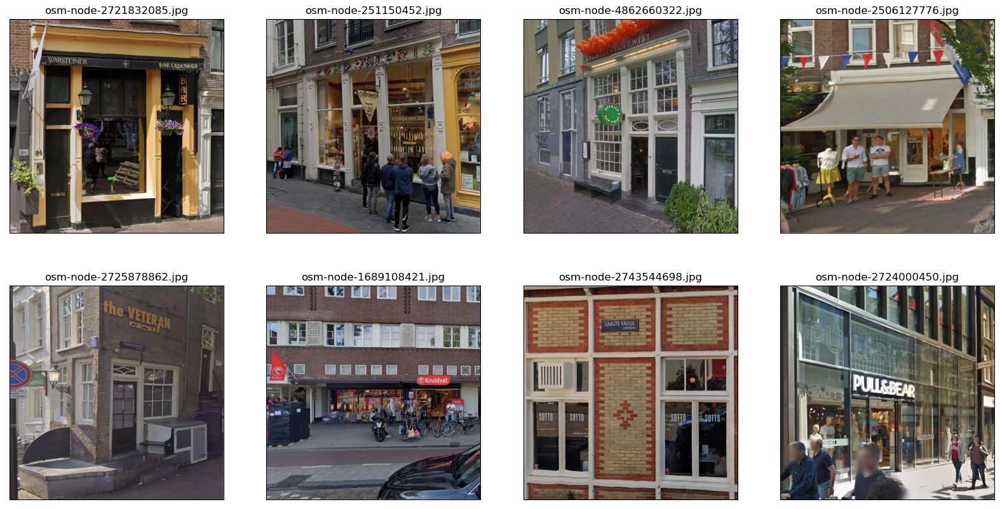

In [10]:
%matplotlib inline

images = []
plt.figure(figsize=(20, 10))

for i, filename in enumerate([filename for filename in os.listdir(dir + 'images/')[:8]]):
    image = Image.open(os.path.join(dir + 'images/', filename))
    plt.subplot(2, 4, i+1)
    plt.imshow(image)
    plt.title(filename)
    plt.xticks([])
    plt.yticks([])
    images.append(image)

### Analysis 1: 
Location analysis

The coordinate column is converted into a POINT geometry for the mapping.

In [11]:
crs = {'init': 'epsg:4326'} 
geometry = [Point(xy) for xy in df["coordinates"]]
geo_df = gpd.GeoDataFrame(df, crs = crs, geometry = geometry)
geo_df.head()

/Users/noemiroos/opt/anaconda3/lib/python3.9/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,image_id,coordinates,coordinates_rev,yes,no,gen_majorityvote,gen_magnitude,geometry
0,osm:node:1223236885,"[4.893005, 52.3799291]","[52.3799291, 4.893005]",12,7,yes,0.631579,POINT (4.89300 52.37993)
1,osm:node:1772991829,"[4.8895298, 52.368966]","[52.368966, 4.8895298]",32,38,no,0.457143,POINT (4.88953 52.36897)
2,osm:node:1977672311,"[4.8026959, 52.3589167]","[52.3589167, 4.8026959]",13,58,no,0.183099,POINT (4.80270 52.35892)
3,osm:node:2507166317,"[4.8995483, 52.356797]","[52.356797, 4.8995483]",29,53,no,0.353659,POINT (4.89955 52.35680)
4,osm:node:2724000369,"[4.8906526, 52.3689837]","[52.3689837, 4.8906526]",17,46,no,0.269841,POINT (4.89065 52.36898)


Here you can see the image distribution on an interactive map.

In [12]:
map1 = folium.Map(location=[52.3680, 4.9036], zoom_start=12)
FastMarkerCluster(data=df["coordinates_rev"], name = df).add_to(map1)
map1

On top of that, the gentrification label and magnitude are also added to the maps.

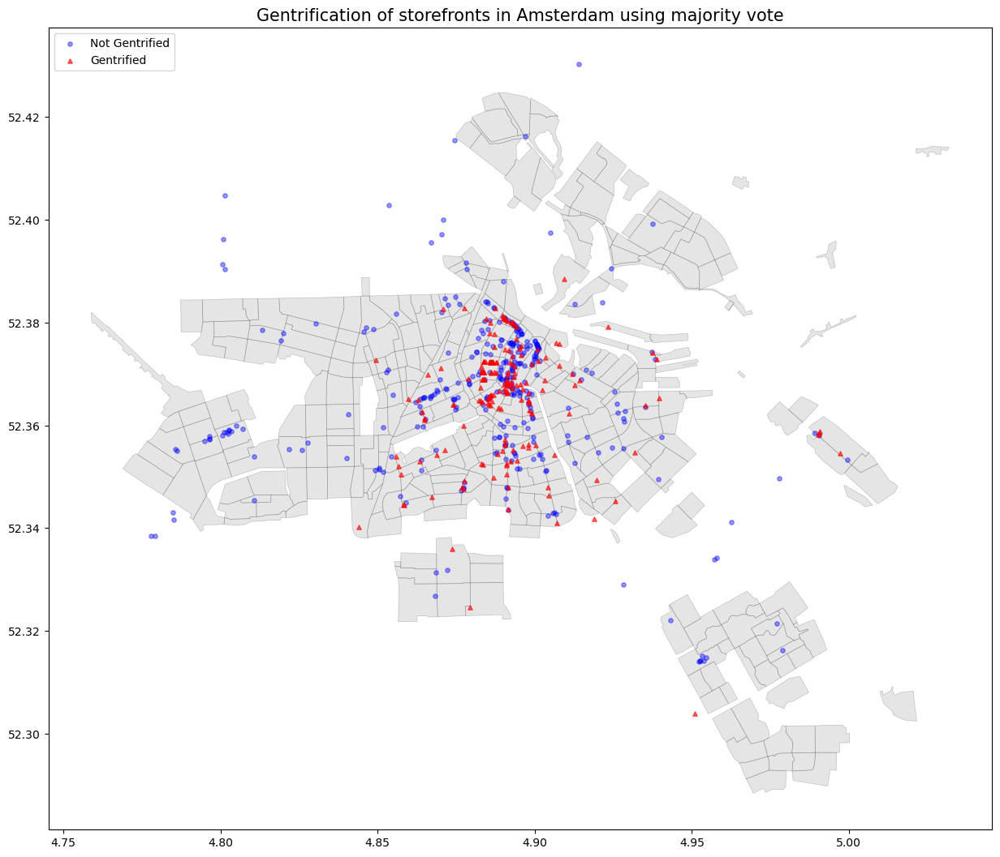

In [13]:
Amsterdam_map = gpd.read_file(dir + 'exploratory-data-analysis/Amsterdam shape file/woonbrt10_region.shp')
Amsterdam_map = Amsterdam_map.to_crs(epsg=4326)

fig, ax = plt.subplots(figsize = (15,15))
Amsterdam_map.plot(ax = ax, alpha=0.2, color='grey', edgecolor='black', linewidth=0.5)
geo_df[geo_df['gen_majorityvote'] == "no"].plot(ax = ax, markersize = 15, color = 'blue', marker = "o", alpha=0.4, label="Not Gentrified")  
geo_df[geo_df['gen_majorityvote'] == "yes"].plot(ax = ax, markersize = 15, color = 'red', marker = "^", alpha=0.6, label="Gentrified")
plt.legend(loc="upper left")
plt.title("Gentrification of storefronts in Amsterdam using majority vote", fontsize=15)
plt.show()

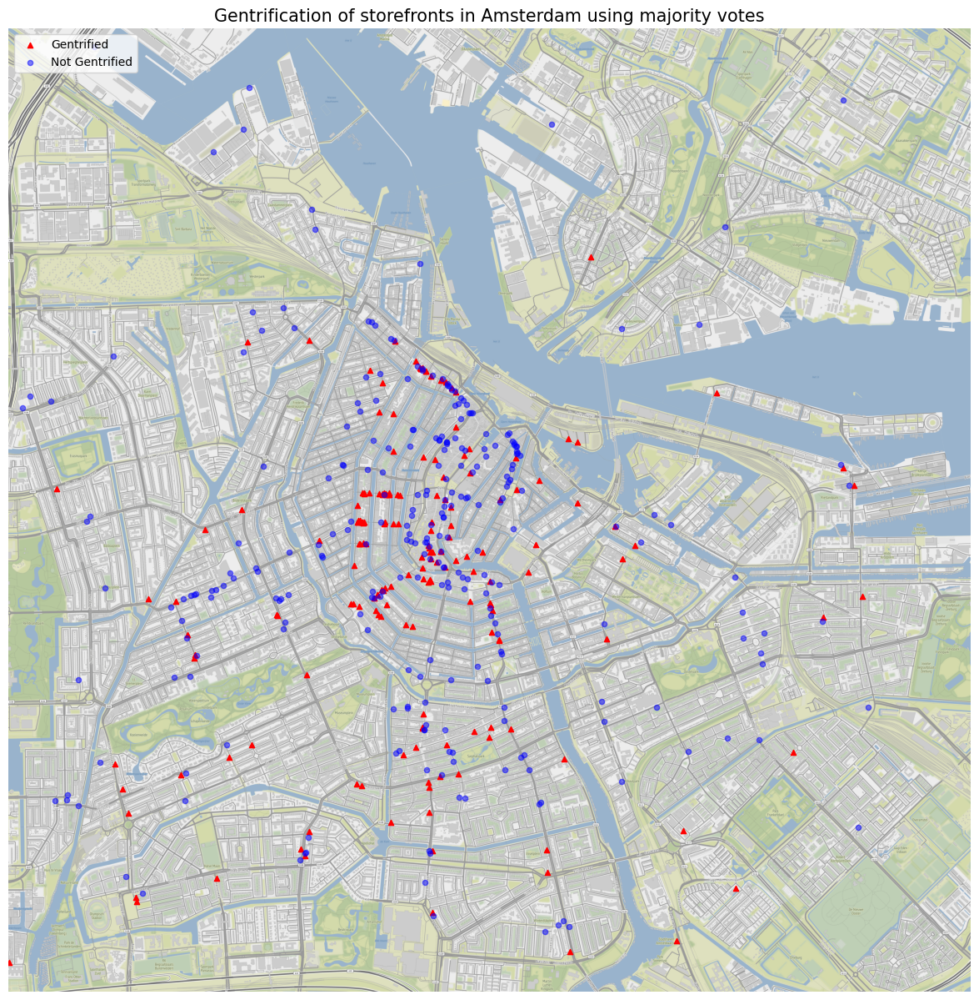

In [14]:
fig, ax = plt.subplots(figsize=(15,15))

geo_df[geo_df['gen_majorityvote'] == "yes"].to_crs(epsg=3857).plot(ax=ax, markersize=20, marker='^', color="red", label="Gentrified")
geo_df[geo_df['gen_majorityvote'] == "no"].to_crs(epsg=3857).plot(ax=ax, markersize=20, marker='o', color="blue", alpha=0.5, label="Not Gentrified")
plt.legend(loc="upper left")

ax.set_xlim((545234.877387-6000), (545234.877387+6000))
ax.set_ylim((6867523.024796-6000), (6867523.024796+6000))
ax.set_axis_off()  
ax.set_title("Gentrification of storefronts in Amsterdam using majority votes", fontsize=15)

xmin, xmax, ymin, ymax = ax.axis()
basemap, extent = ctx.bounds2img(xmin, ymin, xmax, ymax, zoom=16)
ax.imshow(basemap, extent=extent)
plt.show()

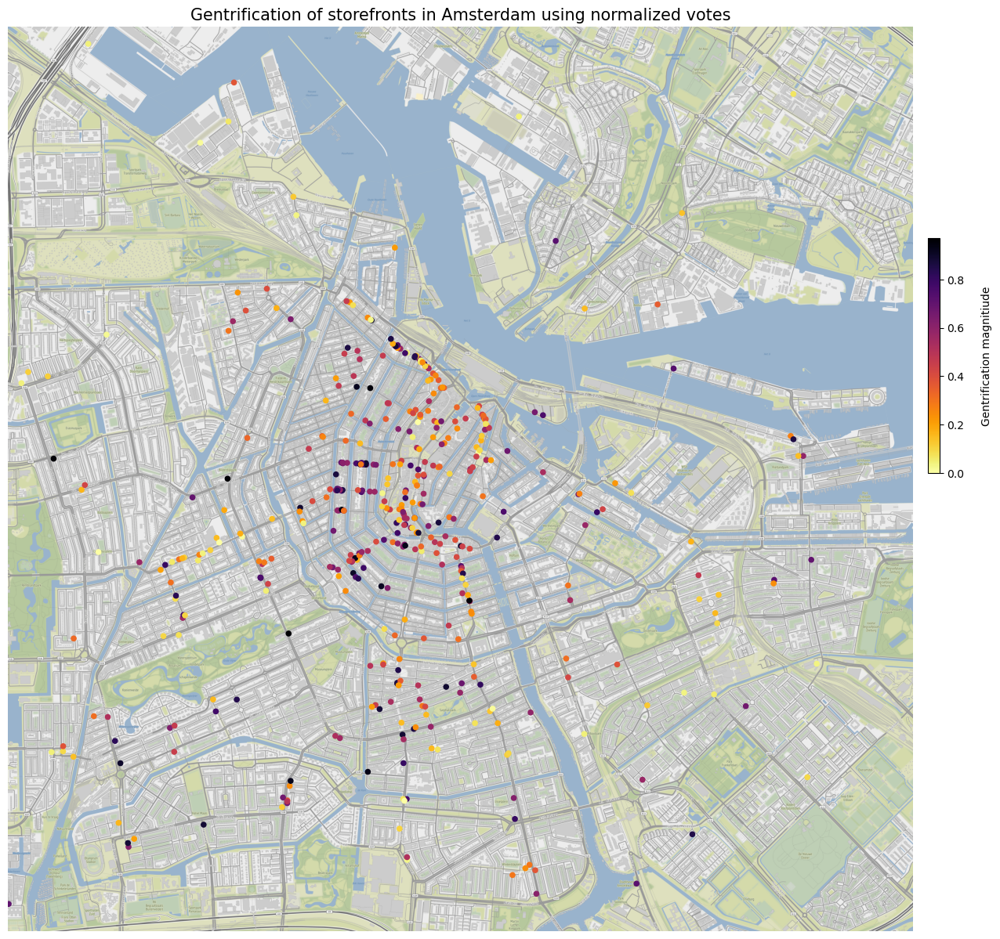

In [15]:
fig, ax = plt.subplots(figsize=(15,15))

geo_df.to_crs(epsg=3857).plot(ax=ax, markersize=20, cmap="inferno_r", column="gen_magnitude")

ax.set_xlim((545234.877387-6000), (545234.877387+6000))
ax.set_ylim((6867523.024796-6000), (6867523.024796+6000))
ax.set_axis_off()  
ax.set_title("Gentrification of storefronts in Amsterdam using normalized votes", fontsize=15)

xmin, xmax, ymin, ymax = ax.axis()
basemap, extent = ctx.bounds2img(xmin, ymin, xmax, ymax, zoom=16)
ax.imshow(basemap, extent=extent)

cax = fig.add_axes([0.91, 0.5, 0.01, 0.2])
sm = plt.cm.ScalarMappable(cmap='inferno_r', norm=plt.Normalize(vmin=df['gen_magnitude'].min(), vmax=df['gen_magnitude'].max()))
sm._A = []
cbar = fig.colorbar(sm, cax=cax,)
cbar.set_label('\nGentrification magnitiude')
cbar.ax.tick_params(labelsize=10)
plt.show()

### Analysis 2: 
Gentrification variable distribution

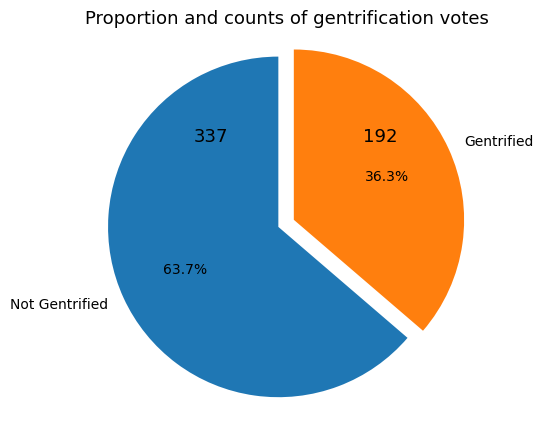

In [16]:
labels = ['Not Gentrified', 'Gentrified']
sizes = [df['gen_majorityvote'].value_counts(normalize=True)[0]*100, df['gen_majorityvote'].value_counts(normalize=True)[1]*100]
explode = (0, 0.1) 

fig1, ax1 = plt.subplots(figsize=(5, 5))
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', startangle=90)
ax1.axis('equal') 

ax1.text(-0.5, 0.5, df['gen_majorityvote'].value_counts()[0], fontsize=13)
ax1.text(0.5, 0.5, df['gen_majorityvote'].value_counts()[1], fontsize=13)
plt.title("Proportion and counts of gentrification votes", fontsize=13)
plt.show()

count    529.000000
mean       0.403869
std        0.265808
min        0.000000
25%        0.160000
50%        0.375000
75%        0.615385
max        0.970588
Name: gen_magnitude, dtype: float64


/Users/noemiroos/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


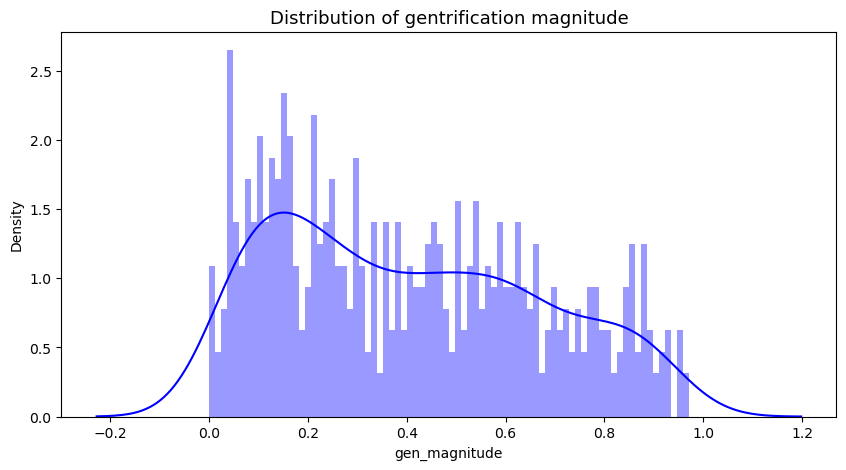

In [17]:
print(df['gen_magnitude'].describe())
plt.figure(figsize=(10, 5))
sns.distplot(df['gen_magnitude'], bins=80, color='blue')
plt.title("Distribution of gentrification magnitude", fontsize=13)
plt.show()

/Users/noemiroos/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/noemiroos/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


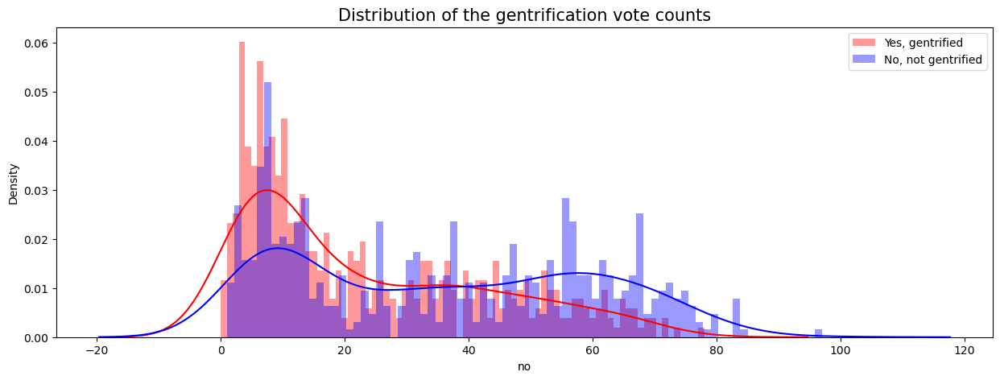

In [18]:
fig, ax = plt.subplots(figsize=(15, 5))
sns.distplot(df['yes'], bins= 80, ax=ax, color='red', label='Yes, gentrified')
sns.distplot(df['no'], bins= 80, ax=ax, color='blue', label='No, not gentrified')
plt.legend()
plt.title("Distribution of the gentrification vote counts", fontsize=15)
plt.show()

In [19]:
def highest_lowest (df, column, column2):
    highest = df.sort_values(by=[column], ascending=False).head(6)[column2].tolist()
    lowest = df.sort_values(by=[column], ascending=True).head(6)[column2].tolist()
    centerest = df[(df[column] > 0.499) & (df[column] < 0.51)].sort_values(by=[column], ascending=True).head(6)[column2].tolist()
    return highest, lowest, centerest

highest_mag_id, lowest_mag_id, closest_to_05_id = highest_lowest(df, 'gen_magnitude', 'image_id')
highest_mag_value, lowest_mag_value, closest_to_05_val = highest_lowest(df, 'gen_magnitude', 'gen_magnitude')

highest_mag_id = [re.sub('[^0-9]', '', i) for i in highest_mag_id]
lowest_mag_id = [re.sub('[^0-9]', '', i) for i in lowest_mag_id]
closest_to_05_id = [re.sub('[^0-9]', '', i) for i in closest_to_05_id]

highest = list(zip(highest_mag_id, highest_mag_value))
lowest = list(zip(lowest_mag_id, lowest_mag_value))
closest_to_05 = list(zip(closest_to_05_id, closest_to_05_val))


Images with the highest gentrification magnitude


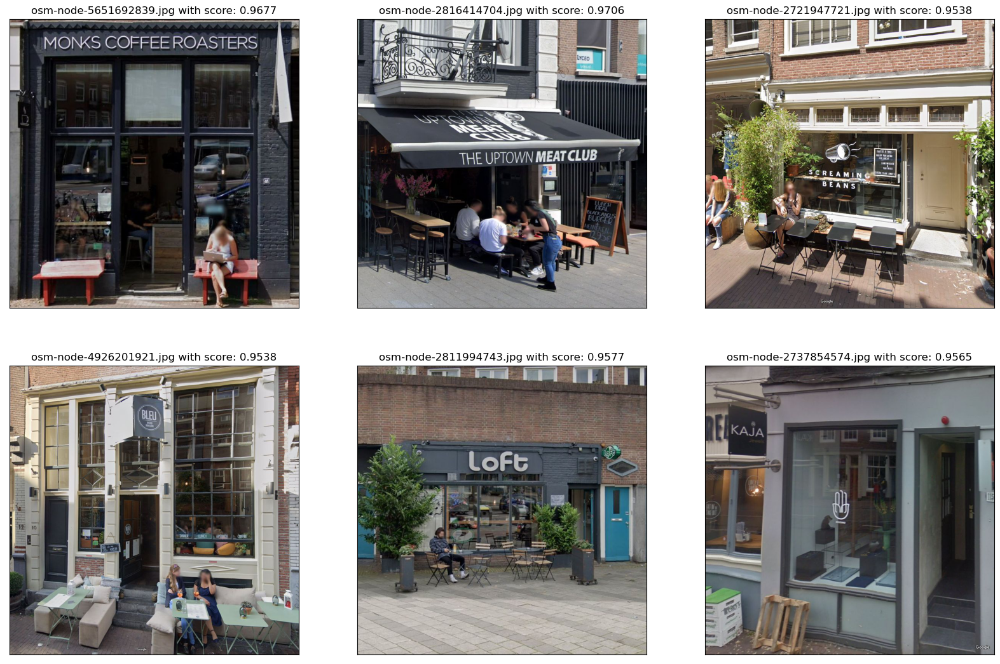

In [20]:
print("\nImages with the highest gentrification magnitude")

images = []
counter = 0
plt.figure(figsize=(20, 13))

for file in os.listdir(dir + 'images/'):
    for i in highest:
        if i[0] in file:
            img = Image.open(dir + 'images/' + file)
            plt.subplot(2, 3, counter+1)
            plt.imshow(img)
            plt.title(file + " with score: " + f"{i[1]:.4f}")
            plt.xticks([])
            plt.yticks([])
            images.append(img)
            counter += 1


Images that are closest to gentrification magnitude 0.5


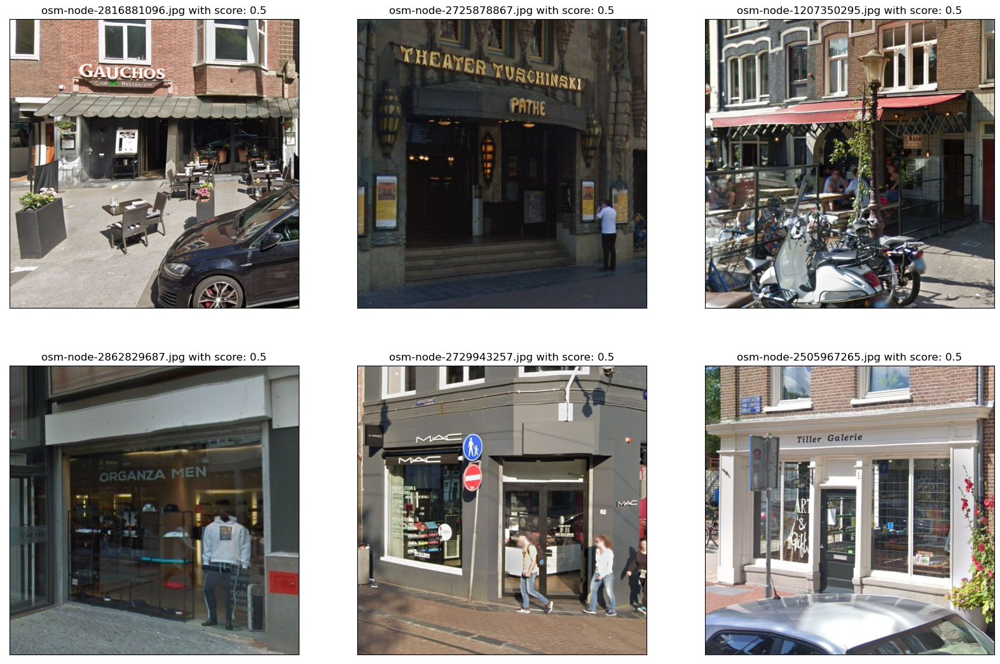

In [21]:
print("\nImages that are closest to gentrification magnitude 0.5")

images = []
counter = 0
plt.figure(figsize=(20, 13))

for file in os.listdir(dir + 'images/'):
    for i in closest_to_05:
        if i[0] in file:
            img = Image.open(dir + 'images/' + file)
            plt.subplot(2, 3, counter+1)
            plt.imshow(img)
            plt.title(file + " with score: " + str(i[1]))
            plt.xticks([])
            plt.yticks([])
            images.append(img)
            counter += 1


Images with the lowest gentrification magnitude


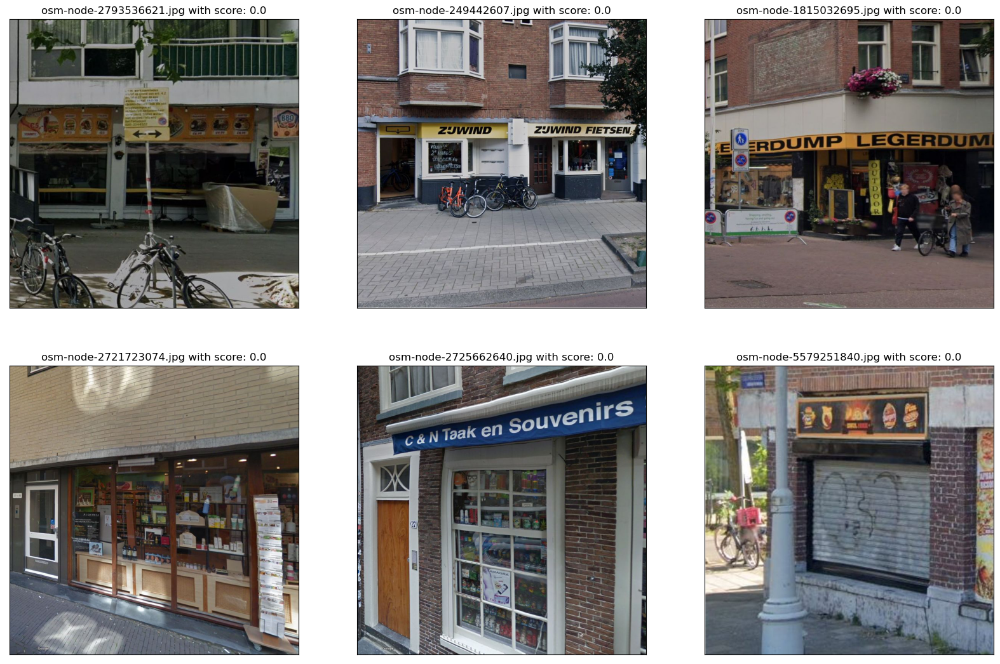

In [22]:
print("\nImages with the lowest gentrification magnitude")

images = []
counter = 0
plt.figure(figsize=(20, 13))

for file in os.listdir(dir + 'images/'):
    for i in lowest:
        if i[0] in file:
            img = Image.open(dir + 'images/' + file)
            plt.subplot(2, 3, counter+1)
            plt.imshow(img)
            plt.title(file + " with score: " + str(i[1]))
            plt.xticks([])
            plt.yticks([])
            images.append(img)
            counter += 1

### Analysis 3: 
Gentrification variable correlation

Here we import data from the City of Amsterdam's Interactive Maps Data. We then plot the housing prices into the dataframe that the image coordinate is contained in. 

In [23]:
Housing_prices = pd.read_csv(dir + 'WONINGWAARDE_2022.csv', sep=";")

In [24]:
pd.options.mode.chained_assignment = None

#convert the WKT_LNG_LAT column from string to polygons
Housing_prices['WKT_LNG_LAT'] = Housing_prices['WKT_LNG_LAT'].apply(shapely.wkt.loads)

df['house_price_polygon'] = ""
df['house_price_range'] = ""
df['house_price'] = ""

for i in range(len(df)):
    point = df['geometry'][i]
    for j in range(len(Housing_prices)):
        polygon = Housing_prices['WKT_LNG_LAT'][j]
        if polygon.contains(point):
            df['house_price_polygon'][i] = polygon
            df['house_price_range'][i] = Housing_prices['LABEL'][j]
            df['house_price'][i] = Housing_prices['SELECTIE'][j]
            break

Here we add the neighborhood and area names to the dataframe that the image coordinate is contained in.

In [25]:
Buurten = pd.read_csv(dir + "INDELING_BUURT.csv", sep=";")

In [26]:
Buurten['WKT_LNG_LAT'] = Buurten['WKT_LNG_LAT'].apply(shapely.wkt.loads)

df['neighborhood_polygon'] = ""
df['neighborhood'] = ""
df['gebied'] = ""
df['district'] = ""

for i in range(len(df)):
    point = df['geometry'][i]
    for j in range(len(Buurten)):
        polygon = Buurten['WKT_LNG_LAT'][j]
        if polygon.contains(point):
            df['neighborhood_polygon'][i] = polygon
            df['neighborhood'][i] = Buurten['Buurt'][j]
            df['gebied'][i] = Buurten['Gebied'][j]
            df['district'][i] = Buurten['Stadsdeel'][j]
            break

In [27]:
df.head(3)

,image_id,coordinates,coordinates_rev,yes,no,gen_majorityvote,gen_magnitude,geometry,house_price_polygon,house_price_range,house_price,neighborhood_polygon,neighborhood,gebied,district
0,osm:node:1223236885,"[4.893005, 52.3799291]","[52.3799291, 4.893005]",12,7,yes,0.631579,POINT (4.89300 52.37993),"POLYGON ((4.8927505 52.3791624, 4.8938764 52.3...",7529-9035,7529,"POLYGON ((4.888437 52.380522, 4.889848 52.3797...",Haarlemmerbuurt-Oost,Centrum-West,Centrum
1,osm:node:1772991829,"[4.8895298, 52.368966]","[52.368966, 4.8895298]",32,38,no,0.457143,POINT (4.88953 52.36897),"POLYGON ((4.8909381 52.3717748, 4.8909523 52.3...",7529-9035,7529,"POLYGON ((4.889189 52.368703, 4.889755 52.3687...",Begijnhofbuurt,Centrum-West,Centrum
2,osm:node:1977672311,"[4.8026959, 52.3589167]","[52.3589167, 4.8026959]",13,58,no,0.183099,POINT (4.80270 52.35892),"POLYGON ((4.8045763 52.3603194, 4.79886 52.359...",5271-6024,5271,"POLYGON ((4.79816 52.359183, 4.799257 52.35803...",Osdorpplein e.o.,Osdorp,Nieuw-West


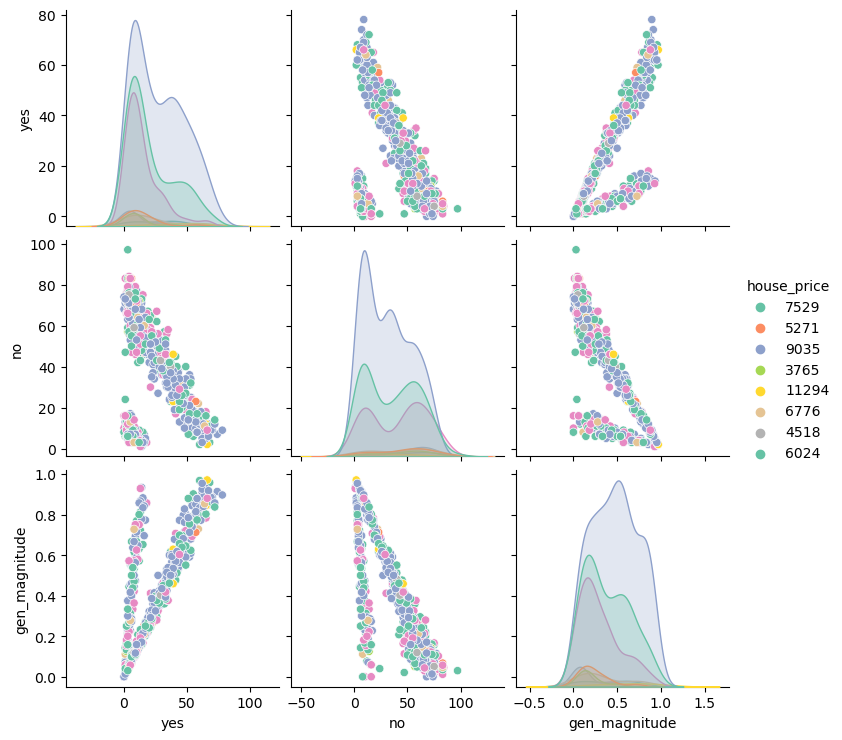

In [28]:
sns.pairplot(df, hue="house_price", palette="Set2")
plt.show()


/Users/noemiroos/opt/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


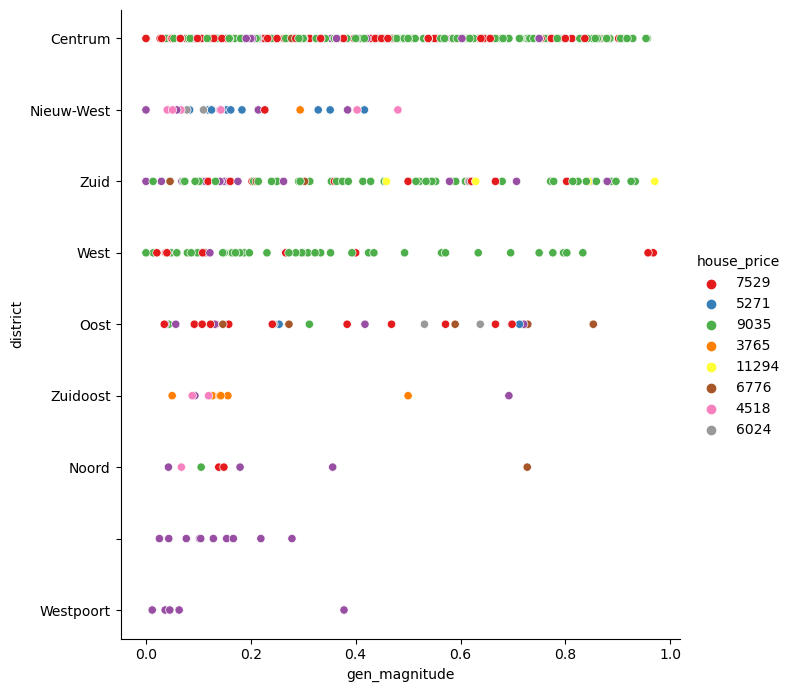

In [29]:
sns.pairplot(df, x_vars=["gen_magnitude"], y_vars=["district"], hue="house_price", palette='Set1', size=7)
plt.show()

Lastly, a Chi square test is performed to demonstrate if there is a significant correlation between the house_price category and the gentrification category, as well as the area category and the gentrification category. A boxplot is also cretaed to visualize the relationship between the gentrification magnitude and the area/house price.

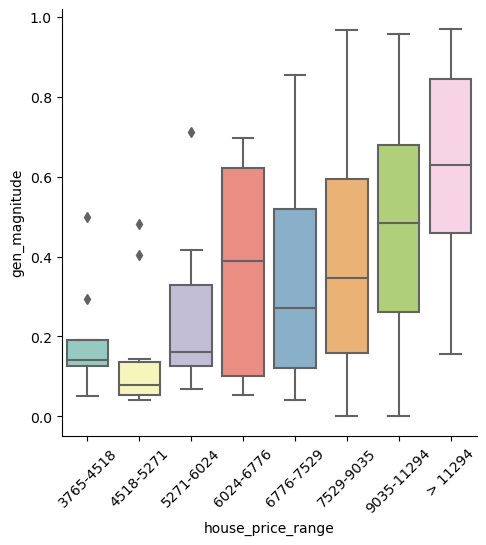

In [30]:
sns.catplot(
    x="house_price_range", 
    y="gen_magnitude", 
    data=df, 
    kind="box", 
    palette="Set3", 
    order=['3765-4518', '4518-5271', '5271-6024', '6024-6776', '6776-7529', '7529-9035', '9035-11294', '> 11294']
)
plt.xticks(rotation=45)
plt.show()

In [31]:
contingency_table = pd.crosstab(df['house_price'], df['gen_majorityvote'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print("chi square:", chi2, " p-value:", p, " dof:", dof)
pd.DataFrame(expected, columns=contingency_table.columns, index=contingency_table.index)

chi square: 39.8001150437761  p-value: 3.4903824503042756e-06  dof: 8


gen_majorityvote,no,yes
house_price,,
3765,5.096408,2.903592
4518,6.370510,3.629490
5271,8.281664,4.718336
6024,5.096408,2.903592
6776,8.918715,5.081285
7529,85.364839,48.635161
9035,159.262760,90.737240
11294,3.185255,1.814745
,55.423440,31.576560


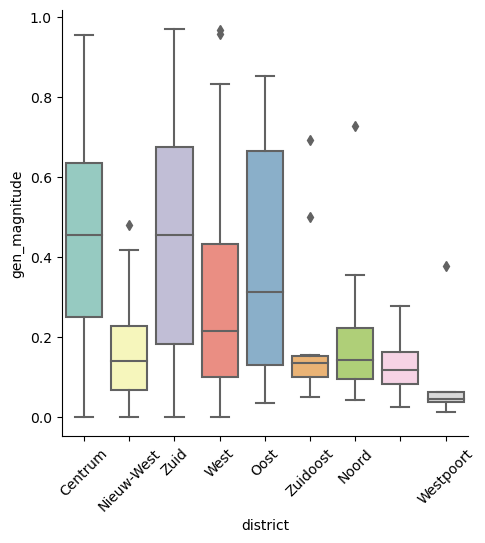

In [32]:
ax = sns.catplot(
    x='district', 
    y='gen_magnitude', 
    data=df,
    kind = 'box', 
    palette="Set3",
)
plt.xticks(rotation=45)
plt.show()

In [33]:
contingency_table = pd.crosstab(df['district'], df['gen_majorityvote'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print("chi square:", chi2, " p-value:", p, " dof:", dof)
pd.DataFrame(expected, columns=contingency_table.columns, index=contingency_table.index)

chi square: 43.17920391624622  p-value: 8.12737197866455e-07  dof: 8


gen_majorityvote,no,yes
district,,
,6.370510,3.629490
Centrum,184.744802,105.255198
Nieuw-West,18.474480,10.525520
Noord,5.096408,2.903592
Oost,21.022684,11.977316
West,34.400756,19.599244
Westpoort,3.185255,1.814745
Zuid,57.334594,32.665406
Zuidoost,6.370510,3.629490
